In [18]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def process_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blurred_frame = cv2.GaussianBlur(gray_frame, (5, 5), 0)
    binary_frame = cv2.adaptiveThreshold(blurred_frame, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    kernel = np.ones((5, 5), np.uint8)
    dilated_frame = cv2.dilate(binary_frame, kernel, iterations=1)
    contours, _ = cv2.findContours(dilated_frame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    frame_with_boxes = frame.copy()
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 0, 255), 2)
        subtitle_roi = binary_frame[y:y+h, x:x+w]
        word_contours, _ = cv2.findContours(subtitle_roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for wc in word_contours:
            wx, wy, ww, wh = cv2.boundingRect(wc)
            cv2.rectangle(frame_with_boxes, (x + wx, y + wy), (x + wx + ww, y + wy + wh), (0, 255, 0), 1)
    return frame_with_boxes

In [19]:
# Paths for input and output videos
input_video_path = '/content/output_with_bounding_boxes.mp4'  # Update with your actual video path
output_video_path = 'output_with_bounding_boxes.mp4'

Processing frame 0/784
Finished processing video.


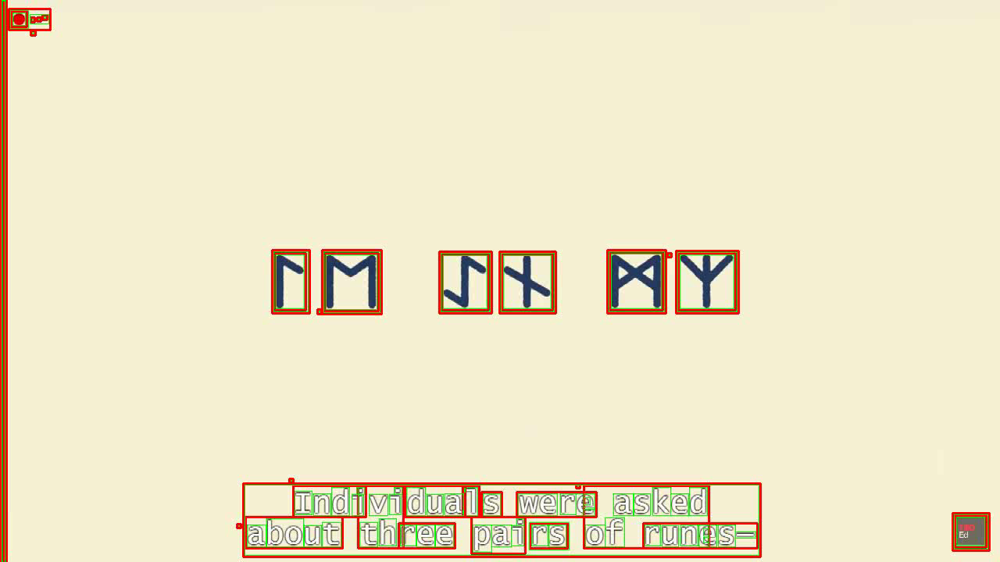

In [20]:




# Read the input video
cap = cv2.VideoCapture(input_video_path)

if not cap.isOpened():
    print(f"Error: Could not open input video at {input_video_path}")
else:
    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Process each frame
    for i in range(frame_count):
        ret, frame = cap.read()
        if not ret:
            break
        processed_frame = process_frame(frame)
        out.write(processed_frame)
        if i % 10 == 0:
            print(f'Processing frame {i}/{frame_count}')

    cap.release()
    out.release()
    print('Finished processing video.')

    # Play the processed video
    cap = cv2.VideoCapture(output_video_path)
    if not cap.isOpened():
        print(f"Error: Could not open output video at {output_video_path}")
    else:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        cap.release()
        cv2.destroyAllWindows()


In [21]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from IPython.display import HTML
from base64 import b64encode

def process_frame(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blurred_frame = cv2.GaussianBlur(gray_frame, (5, 5), 0)
    binary_frame = cv2.adaptiveThreshold(blurred_frame, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    kernel = np.ones((5, 5), np.uint8)
    dilated_frame = cv2.dilate(binary_frame, kernel, iterations=1)
    contours, _ = cv2.findContours(dilated_frame, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    frame_with_boxes = frame.copy()
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 0, 255), 2)
        subtitle_roi = binary_frame[y:y+h, x:x+w]
        word_contours, _ = cv2.findContours(subtitle_roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for wc in word_contours:
            wx, wy, ww, wh = cv2.boundingRect(wc)
            cv2.rectangle(frame_with_boxes, (x + wx, y + wy), (x + wx + ww, y + wy + wh), (0, 255, 0), 1)
    return frame_with_boxes

# Paths for input and output videos
input_video_path = '/content/Project Video - Trim.mp4'
output_video_path = 'output_with_bounding_boxes.mp4'

# Read the input video
cap = cv2.VideoCapture(input_video_path)

if not cap.isOpened():
    print(f"Error: Could not open input video at {input_video_path}")
else:
    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Process each frame
    for i in range(frame_count):
        ret, frame = cap.read()
        if not ret:
            break
        processed_frame = process_frame(frame)
        out.write(processed_frame)
        if i % 10 == 0:
            print(f'Processing frame {i}/{frame_count}')

    cap.release()
    out.release()
    print('Finished processing video.')

    # Display the processed video
    with open(output_video_path, 'rb') as f:
        video_data = f.read()
    video_b64 = b64encode(video_data).decode('utf-8')
    video_html = f'<video width="640" height="480" controls><source src="data:video/mp4;base64,{video_b64}" type="video/mp4"></video>'
    display(HTML(video_html))


Processing frame 0/784
Processing frame 10/784
Processing frame 20/784
Processing frame 30/784
Processing frame 40/784
Processing frame 50/784
Processing frame 60/784
Processing frame 70/784
Processing frame 80/784
Processing frame 90/784
Processing frame 100/784
Processing frame 110/784
Processing frame 120/784
Processing frame 130/784
Processing frame 140/784
Processing frame 150/784
Processing frame 160/784
Processing frame 170/784
Processing frame 180/784
Processing frame 190/784
Processing frame 200/784
Processing frame 210/784
Processing frame 220/784
Processing frame 230/784
Processing frame 240/784
Processing frame 250/784
Processing frame 260/784
Processing frame 270/784
Processing frame 280/784
Processing frame 290/784
Processing frame 300/784
Processing frame 310/784
Processing frame 320/784
Processing frame 330/784
Processing frame 340/784
Processing frame 350/784
Processing frame 360/784
Processing frame 370/784
Processing frame 380/784
Processing frame 390/784
Processing 